In [1]:
import os
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
os.chdir('drive/My Drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
%cd "/content/drive/My Drive/NIMA/NIMA"

/content/drive/My Drive/NIMA/NIMA


In [3]:
!pip install tensorboardX

     |████████████████████████████████| 245kB 9.3MB/s 


In [2]:
import os
import torch
import torch.nn as nn
from torch.autograd import Variable
import torchvision.datasets as dset
import torch.nn.functional as F
import torch.optim as optim
from tqdm import tqdm_notebook as tqdm
from torchvision.transforms import Compose, ToTensor
from torchvision import datasets,models
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from itertools import cycle
import matplotlib.pyplot as plt
import random
from torchsummary import summary
import pickle
from PIL import Image
from torchvision.utils import save_image
import numpy as np
import torchvision.transforms as transforms
from torchvision.datasets.folder import default_loader
import json
from pprint import pprint
from collections import OrderedDict
import tensorflow as tf
from tensorboardX import SummaryWriter as Writer

/Users/Saurkum/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.6 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.7
  return f(*args, **kwds)


In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cpu


In [4]:
def savePickle(name, toSave):
    file = open(name, 'wb')
    pickle.dump(toSave, file)
    file.close()

def loadPickle(name):
    file = open(name, 'rb')
    data = pickle.load(file)
    file.close()
    return data

# calculate mean score for AVA dataset
def mean_score(scores):
    si = np.arange(1, 11, 1)
    mean = np.sum(scores * si)
    return mean

# calculate standard deviation of scores for AVA dataset
def std_score(scores):
    si = np.arange(1, 11, 1)
    mean = mean_score(scores)
    std = np.sqrt(np.sum(((si - mean) ** 2) * scores))
    return std

def accuracy(p,q):
    c =0
    p = p.flatten()
    q = q.flatten()
    for i in range(len(p)):
        if p[i] == q[i]:
            c+=1
    return c

def linearCorelationCofficient(p,q):
    p = np.array(p)
    q = np.array(q)
    return np.corrcoef(p,q)[0,1]


def normalize_labels(labels):
    labels_np = np.array(labels)
    return labels_np / labels_np.sum()


def calculateMean(score_dist):
    labels_np = np.array(score_dist)
    score_dist = labels_np / labels_np.sum()
    return (score_dist*np.arange(1, 11)).sum()

def tfTensorToNumpy(var):
    init = tf.global_variables_initializer()
    sess = tf.Session()
    with sess.as_default():
        array = var.eval()
    return np.array(array)

class AverageMeter(object):
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        val = np.array(val)
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

class EDMLoss(nn.Module):
    def __init__(self):
        super(EDMLoss, self).__init__()

    def forward(self, p_target: Variable, p_estimate: Variable):
        assert p_target.shape == p_estimate.shape
        cdf_target = torch.cumsum(p_target, dim=1)
        cdf_estimate = torch.cumsum(p_estimate, dim=1)
        cdf_diff = cdf_estimate - cdf_target
        samplewise_emd = torch.sqrt(torch.mean(torch.pow(torch.abs(cdf_diff), 2)))
        return samplewise_emd.mean()

In [5]:
def mu(y):
    """mean quality score for ratings
    
    Args:
      y: a mini-batch of ratings, each composed of a count of scores 
                shape = (None, n), array of count of scores for score from 1..n
    Returns:
      array of [mean] floats for each row in y
    """
    m,n = tf.convert_to_tensor(y).get_shape().as_list()  
    y = tf.to_float(y)
    cs = tf.reduce_sum(tf.cumsum(y, axis=1, reverse=True), axis=1)
    total = tf.reduce_sum(y, axis=1)
    return tf.reshape(cs/total, [m,1] ) # (None,1) [m,1]

def spearman_rank(y, y_hat):
    """returns the Spearman Ranked Correlation Coefficinet of the batch
      see: https://stackoverflow.com/questions/38487410/possible-to-use-rank-correlation-as-cost-function-in-tensorflow
      https://geographyfieldwork.com/SpearmansRank.htm 
      Returns tf.float32 [-1..1]
    """
    try:
        y = tf.to_float(y)
        m,n = y.get_shape().as_list()
    except:
        m,n = np.shape(y)

    if n > 1:
        # derive stddev from ratings
        y_hat_batch = tf.squeeze(mu(y_hat))
        y_batch = tf.squeeze(mu(y))
    else:
        # assume we already have stddev values
        y_hat_batch = tf.squeeze(y_hat)
        y_batch = tf.squeeze(y)
    y_hat_rank = tf.nn.top_k(y_hat_batch, k=m, sorted=True, name='y_hat_rank').indices
    y_rank = tf.nn.top_k(y_batch, k=m, sorted=True, name='y_rank').indices
    rank_diffs = y_hat_rank - y_rank
    rank_diffs_squared_sum = tf.reduce_sum(rank_diffs * rank_diffs)
    six = tf.constant(6)
    one = tf.constant(1.0)
    numerator = tf.cast(six * rank_diffs_squared_sum, dtype=tf.float32)
    divider = tf.cast(m * m * m - m, dtype=tf.float32)
    spearman_batch = one - (numerator / divider)
    return spearman_batch

def linear_correlation(y, y_hat):
    """returns the linear correlation coefficient
      see: https://www.mathway.com/examples/statistics/correlation-and-regression/finding-the-linear-correlation-coefficient?id=328
    Returns: tf.float32 [-1..1]  
    """
    try:
        y = tf.to_float(y)
        m,n = y.get_shape().as_list()
    except:
        m,n = np.shape(y)

    if n > 1:
        # derive stddev from ratings
        predictions_batch = mu(y_hat)
        labels_batch = mu(y)
    else:
        # assume we already have stddev values
        predictions_batch = y_hat
        labels_batch = y

    sum_y = tf.squeeze(tf.reduce_sum(labels_batch, axis=0))
    sum_y2 = tf.squeeze(tf.reduce_sum(tf.square(labels_batch), axis=0))
    sum_y_hat = tf.squeeze(tf.reduce_sum(predictions_batch, axis=0))
    sum_y_hat2 = tf.squeeze(tf.reduce_sum(tf.square(predictions_batch), axis=0))
    yy_hat_matmul = tf.squeeze(tf.matmul(tf.transpose(labels_batch),predictions_batch))  # [1 m] * [ m 1] = [1 1]

    numerator = (m * yy_hat_matmul) - (sum_y * sum_y_hat)
    denominator = tf.sqrt((m*sum_y2)-tf.square(sum_y)) * tf.sqrt((m*sum_y_hat2)-tf.square(sum_y_hat))

    lcc = numerator/denominator
    return lcc

In [11]:
numClasses = 10
startEpoch = 0
endEpoch = 500
tid2013DataPath = '/content/drive/My Drive/NIMADataset/TID2013Dataset/'
myFacesDataPath = '/content/drive/My Drive/NIMADataset/myFaces/'
avaDatapath = './'
lr = 0.01
batchSize = 64
resizeSize = 256
cropSize = 224

#_architecture = "VGG" #nasnet
_architecture = "INCEPTIONV3"
#_architecture = "NASNET"
#_dataset = "TID2013" 
_dataset = "AVA"

if _architecture == "INCEPTIONV3":
    batchSize = 64
    resizeSize = 332
    cropSize = 299
if _architecture == "NASNET":
    batchSize = 2

modelPath = _architecture + "_" + _dataset

In [7]:
data_transforms = {
    "TRAIN": transforms.Compose([
        transforms.RandomResizedCrop(cropSize),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),
    ]),
    "VAL": transforms.Compose([
        transforms.Resize(resizeSize),
        transforms.CenterCrop(cropSize),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),
    ]),
    "TEST": transforms.Compose([
        transforms.Resize(resizeSize),
        transforms.CenterCrop(cropSize),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),
    ]),
    "IMAGE": transforms.Compose([transforms.Resize(resizeSize),transforms.CenterCrop(cropSize)])
}

In [16]:
class AVADataset(Dataset):
    def __init__(self,jsonPath, transform = None):
        with open(jsonPath) as f:
            data = json.load(f)
        self.x = []
        self.y = []
        self.transform = transform
        for i in tqdm(data):
            self.x.append(avaDatapath+"images_T/images/"+i['image_id'])
            self.y.append(i['label'])
        
    def __len__(self):
        return len(self.x)
    
    def __getitem__(self, item):
        while not os.path.exists(x[item]+".jpg"):
            item = random.randint(0,len(self.x))
        img = Image.open(open(self.x[item]+".jpg",'rb'))
        if np.array(img).ndim == 2:
            imgT = Image.new("RGB", img.size)
            imgT.paste(img)
            img = imgT 
        return self.transform(img), np.array(self.y[item]).astype('float32'), None
    
if _dataset == "AVA":
    trainDataset = AVADataset(avaDatapath + "ava_labels_train.json", data_transforms["TRAIN"])
    trainLoader = DataLoader(trainDataset, batch_size=batchSize, shuffle=False, num_workers=0)
    testDataset = AVADataset(avaDatapath + "ava_labels_test.json",data_transforms["VAL"])
    testLoader = DataLoader(testDataset, batch_size=batchSize, shuffle=False, num_workers=0)
    print(len(trainLoader),len(testLoader))


3594 400


In [0]:
class TID2013Dataset(Dataset):
    def __init__(self,jsonPath, transform = None):
        with open(jsonPath) as f:
            data = json.load(f)
        self.x = []
        self.y = []
        self.transform = transform
        for i in tqdm(data):
            try:
                self.x.append(Image.open(open(tid2013DataPath+i['image_id']+".bmp",'rb')))
            except OSError as e:
                self.x.append(Image.open(open(tid2013DataPath+i['image_id']+".BMP",'rb')))
            self.y.append(i['label'])
        
    def __len__(self):
        return len(self.x)
    
    def __getitem__(self, item):
            return self.transform(self.x[item]), np.array(self.y[item]).astype('float32'), np.array(data_transforms["IMAGE"](self.x[item]))
    
if _dataset == "TID2013":
    trainDataset = TID2013Dataset(tid2013DataPath + "tid_labels_train.json", data_transforms["TRAIN"])
    trainLoader = DataLoader(trainDataset, batch_size=batchSize, shuffle=False, num_workers=0)
    testDataset = TID2013Dataset(tid2013DataPath + "tid_labels_test.json",data_transforms["VAL"])
    testLoader = DataLoader(testDataset, batch_size=batchSize, shuffle=False, num_workers=0)
    print(len(trainLoader),len(testLoader))

OSError: ignored

In [8]:
def getVGG16():
    vgg16 = models.vgg16_bn(pretrained=True)
    num_features = vgg16.classifier[6].in_features
    features = list(vgg16.classifier.children())[:-1] # Remove last layer
    features.extend([nn.Linear(num_features, numClasses)]) # Add our layer with 10 outputs
    features.extend([nn.Softmax()]) 
    vgg16.classifier = nn.Sequential(*features) # Replace the model classifier
    return vgg16



In [9]:
def getInceptionV3():
    inception = models.inception_v3(pretrained=True)
    num_features = inception.fc.in_features
    inception.fc = nn.Linear(num_features, numClasses)
    return inception

# NASNET

In [0]:
class SeparableConv2d(nn.Sequential):

    def __init__(self, in_channels, out_channels, dw_kernel, dw_stride, dw_padding, bias=False):
        super(SeparableConv2d, self).__init__()
        self.depthwise_conv2d = nn.Conv2d(in_channels, in_channels, dw_kernel,
                                          stride=dw_stride,
                                          padding=dw_padding,
                                          bias=bias,
                                          groups=in_channels)
        self.pointwise_conv2d = nn.Conv2d(in_channels, out_channels, 1, stride=1, bias=bias)


class BranchSeparables(nn.Sequential):

    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, bias=False):
        super(BranchSeparables, self).__init__()
        self.relu = nn.ReLU()
        self.separable_1 = SeparableConv2d(in_channels, in_channels, kernel_size, stride, padding, bias=bias)
        self.bn_sep_1 = nn.BatchNorm2d(in_channels, eps=0.001, momentum=0.1, affine=True)
        self.relu1 = nn.ReLU()
        self.separable_2 = SeparableConv2d(in_channels, out_channels, kernel_size, 1, padding, bias=bias)
        self.bn_sep_2 = nn.BatchNorm2d(out_channels, eps=0.001, momentum=0.1, affine=True)


class BranchSeparablesStem(nn.Sequential):

    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, bias=False):
        super(BranchSeparablesStem, self).__init__()
        self.relu = nn.ReLU()
        self.separable_1 = SeparableConv2d(in_channels, out_channels, kernel_size, stride, padding, bias=bias)
        self.bn_sep_1 = nn.BatchNorm2d(out_channels, eps=0.001, momentum=0.1, affine=True)
        self.relu1 = nn.ReLU()
        self.separable_2 = SeparableConv2d(out_channels, out_channels, kernel_size, 1, padding, bias=bias)
        self.bn_sep_2 = nn.BatchNorm2d(out_channels, eps=0.001, momentum=0.1, affine=True)


def ReductionCellBranchCombine(cell, x_left, x_right):

    x_comb_iter_0_left = cell.comb_iter_0_left(x_left)
    x_comb_iter_0_right = cell.comb_iter_0_right(x_right)
    x_comb_iter_0 = x_comb_iter_0_left + x_comb_iter_0_right

    x_comb_iter_1_left = cell.comb_iter_1_left(x_left)
    x_comb_iter_1_right = cell.comb_iter_1_right(x_right)
    x_comb_iter_1 = x_comb_iter_1_left + x_comb_iter_1_right

    x_comb_iter_2_left = cell.comb_iter_2_left(x_left)
    x_comb_iter_2_right = cell.comb_iter_2_right(x_right)
    x_comb_iter_2 = x_comb_iter_2_left + x_comb_iter_2_right

    x_comb_iter_3_right = cell.comb_iter_3_right(x_comb_iter_0)
    x_comb_iter_3 = x_comb_iter_3_right + x_comb_iter_1

    x_comb_iter_4_left = cell.comb_iter_4_left(x_comb_iter_0)
    x_comb_iter_4_right = cell.comb_iter_4_right(x_left)
    x_comb_iter_4 = x_comb_iter_4_left + x_comb_iter_4_right

    x_out = torch.cat([x_comb_iter_1, x_comb_iter_2, x_comb_iter_3, x_comb_iter_4], 1)
    return x_out


class CellStem0(nn.Module):

    def __init__(self, in_channels, out_channels):
        super(CellStem0, self).__init__()
        self.conv_1x1 = nn.Sequential()
        self.conv_1x1.add_module('relu', nn.ReLU())
        self.conv_1x1.add_module('conv', nn.Conv2d(in_channels, out_channels, 1, stride=1, bias=False))
        self.conv_1x1.add_module('bn', nn.BatchNorm2d(out_channels, eps=0.001, momentum=0.1, affine=True))

        self.comb_iter_0_left = BranchSeparables(out_channels, out_channels, 5, 2, 2, bias=False)
        self.comb_iter_0_right = BranchSeparablesStem(in_channels, out_channels, 7, 2, 3, bias=False)

        self.comb_iter_1_left = nn.MaxPool2d(3, stride=2, padding=1)
        self.comb_iter_1_right = BranchSeparablesStem(in_channels, out_channels, 7, 2, 3, bias=False)

        self.comb_iter_2_left = nn.AvgPool2d(3, stride=2, padding=1, count_include_pad=False)
        self.comb_iter_2_right = BranchSeparablesStem(in_channels, out_channels, 5, 2, 2, bias=False)

        self.comb_iter_3_right = nn.AvgPool2d(3, stride=1, padding=1, count_include_pad=False)

        self.comb_iter_4_left = BranchSeparables(out_channels, out_channels, 3, 1, 1, bias=False)
        self.comb_iter_4_right = nn.MaxPool2d(3, stride=2, padding=1)

    def forward(self, x):
        x1 = self.conv_1x1(x)

        return ReductionCellBranchCombine(self, x1, x)


class CellStem1(nn.Module):

    def __init__(self, in_channels_x, in_channels_h, out_channels):
        super(CellStem1, self).__init__()
        self.conv_1x1 = nn.Sequential()
        self.conv_1x1.add_module('relu', nn.ReLU())
        self.conv_1x1.add_module('conv', nn.Conv2d(in_channels_x, out_channels, 1, stride=1, bias=False))
        self.conv_1x1.add_module('bn', nn.BatchNorm2d(out_channels, eps=0.001, momentum=0.1, affine=True))

        self.relu = nn.ReLU()
        self.path_1 = nn.Sequential()
        self.path_1.add_module('avgpool', nn.AvgPool2d(1, stride=2, count_include_pad=False))
        self.path_1.add_module('conv', nn.Conv2d(in_channels_h, out_channels//2, 1, stride=1, bias=False))
        self.path_2 = nn.Sequential()
        self.path_2.add_module('avgpool', nn.AvgPool2d(1, stride=2, ceil_mode=True, count_include_pad=False)) # ceil mode for padding
        self.path_2.add_module('conv', nn.Conv2d(in_channels_h, out_channels//2, 1, stride=1, bias=False))

        self.final_path_bn = nn.BatchNorm2d(out_channels, eps=0.001, momentum=0.1, affine=True)

        self.comb_iter_0_left = BranchSeparables(out_channels, out_channels, 5, 2, 2, bias=False)
        self.comb_iter_0_right = BranchSeparables(out_channels, out_channels, 7, 2, 3, bias=False)

        self.comb_iter_1_left = nn.MaxPool2d(3, stride=2, padding=1)
        self.comb_iter_1_right = BranchSeparables(out_channels, out_channels, 7, 2, 3, bias=False)

        self.comb_iter_2_left = nn.AvgPool2d(3, stride=2, padding=1, count_include_pad=False)
        self.comb_iter_2_right = BranchSeparables(out_channels, out_channels, 5, 2, 2, bias=False)

        self.comb_iter_3_right = nn.AvgPool2d(3, stride=1, padding=1, count_include_pad=False)

        self.comb_iter_4_left = BranchSeparables(out_channels, out_channels, 3, 1, 1, bias=False)
        self.comb_iter_4_right = nn.MaxPool2d(3, stride=2, padding=1)

    def forward(self, x_conv0, x_stem_0):
        x_left = self.conv_1x1(x_stem_0)

        x_relu = self.relu(x_conv0)
        # path 1
        x_path1 = self.path_1(x_relu)
        # path 2
        x_path2 = self.path_2(x_relu[:, :, 1:, 1:])
        # final path
        x_right = self.final_path_bn(torch.cat([x_path1, x_path2], 1))

        return ReductionCellBranchCombine(self, x_left, x_right)


class ReductionCell(nn.Module):

    def __init__(self, in_channels_left, out_channels_left, in_channels_right, out_channels_right):
        super(ReductionCell, self).__init__()
        self.conv_prev_1x1 = nn.Sequential()
        self.conv_prev_1x1.add_module('relu', nn.ReLU())
        self.conv_prev_1x1.add_module('conv', nn.Conv2d(in_channels_left, out_channels_left, 1, stride=1, bias=False))
        self.conv_prev_1x1.add_module('bn', nn.BatchNorm2d(out_channels_left, eps=0.001, momentum=0.1, affine=True))

        self.conv_1x1 = nn.Sequential()
        self.conv_1x1.add_module('relu', nn.ReLU())
        self.conv_1x1.add_module('conv', nn.Conv2d(in_channels_right, out_channels_right, 1, stride=1, bias=False))
        self.conv_1x1.add_module('bn', nn.BatchNorm2d(out_channels_right, eps=0.001, momentum=0.1, affine=True))

        self.comb_iter_0_left = BranchSeparables(out_channels_right, out_channels_right, 5, 2, 2, bias=False)
        self.comb_iter_0_right = BranchSeparables(out_channels_right, out_channels_right, 7, 2, 3, bias=False)

        self.comb_iter_1_left = nn.MaxPool2d(3, stride=2, padding=1)
        self.comb_iter_1_right = BranchSeparables(out_channels_right, out_channels_right, 7, 2, 3, bias=False)

        self.comb_iter_2_left = nn.AvgPool2d(3, stride=2, padding=1, count_include_pad=False)
        self.comb_iter_2_right = BranchSeparables(out_channels_right, out_channels_right, 5, 2, 2, bias=False)

        self.comb_iter_3_right = nn.AvgPool2d(3, stride=1, padding=1, count_include_pad=False)

        self.comb_iter_4_left = BranchSeparables(out_channels_right, out_channels_right, 3, 1, 1, bias=False)
        self.comb_iter_4_right = nn.MaxPool2d(3, stride=2, padding=1)

    def forward(self, x, x_prev):
        x_left = self.conv_1x1(x)
        x_right = self.conv_prev_1x1(x_prev)
        return ReductionCellBranchCombine(self, x_left, x_right)


def NormalCellBranchCombine(cell, x_left, x_right):
    x_comb_iter_0_left = cell.comb_iter_0_left(x_right)
    x_comb_iter_0_right = cell.comb_iter_0_right(x_left)
    x_comb_iter_0 = x_comb_iter_0_left + x_comb_iter_0_right

    x_comb_iter_1_left = cell.comb_iter_1_left(x_left)
    x_comb_iter_1_right = cell.comb_iter_1_right(x_left)
    x_comb_iter_1 = x_comb_iter_1_left + x_comb_iter_1_right

    x_comb_iter_2_left = cell.comb_iter_2_left(x_right)
    x_comb_iter_2 = x_comb_iter_2_left + x_left

    x_comb_iter_3_left = cell.comb_iter_3_left(x_left)
    x_comb_iter_3_right = cell.comb_iter_3_right(x_left)
    x_comb_iter_3 = x_comb_iter_3_left + x_comb_iter_3_right

    x_comb_iter_4_left = cell.comb_iter_4_left(x_right)
    x_comb_iter_4 = x_comb_iter_4_left + x_right

    x_out = torch.cat([x_left, x_comb_iter_0, x_comb_iter_1, x_comb_iter_2, x_comb_iter_3, x_comb_iter_4], 1)
    return x_out


class FirstCell(nn.Module):

    def __init__(self, in_channels_left, out_channels_left, in_channels_right, out_channels_right):
        super(FirstCell, self).__init__()
        self.conv_1x1 = nn.Sequential()
        self.conv_1x1.add_module('relu', nn.ReLU())
        self.conv_1x1.add_module('conv', nn.Conv2d(in_channels_right, out_channels_right, 1, stride=1, bias=False))
        self.conv_1x1.add_module('bn', nn.BatchNorm2d(out_channels_right, eps=0.001, momentum=0.1, affine=True))

        self.relu = nn.ReLU()
        self.path_1 = nn.Sequential()
        self.path_1.add_module('avgpool', nn.AvgPool2d(1, stride=2, count_include_pad=False))
        self.path_1.add_module('conv', nn.Conv2d(in_channels_left, out_channels_left, 1, stride=1, bias=False))
        self.path_2 = nn.Sequential()
        self.path_2.add_module('avgpool', nn.AvgPool2d(1, stride=2, ceil_mode=True, count_include_pad=False))
        self.path_2.add_module('conv', nn.Conv2d(in_channels_left, out_channels_left, 1, stride=1, bias=False))

        self.final_path_bn = nn.BatchNorm2d(out_channels_left * 2, eps=0.001, momentum=0.1, affine=True)

        self.comb_iter_0_left = BranchSeparables(out_channels_right, out_channels_right, 5, 1, 2, bias=False)
        self.comb_iter_0_right = BranchSeparables(out_channels_right, out_channels_right, 3, 1, 1, bias=False)

        self.comb_iter_1_left = BranchSeparables(out_channels_right, out_channels_right, 5, 1, 2, bias=False)
        self.comb_iter_1_right = BranchSeparables(out_channels_right, out_channels_right, 3, 1, 1, bias=False)

        self.comb_iter_2_left = nn.AvgPool2d(3, stride=1, padding=1, count_include_pad=False)

        self.comb_iter_3_left = nn.AvgPool2d(3, stride=1, padding=1, count_include_pad=False)
        self.comb_iter_3_right = nn.AvgPool2d(3, stride=1, padding=1, count_include_pad=False)

        self.comb_iter_4_left = BranchSeparables(out_channels_right, out_channels_right, 3, 1, 1, bias=False)

    def forward(self, x, x_prev):
        x_relu = self.relu(x_prev)
        # path 1
        x_path1 = self.path_1(x_relu)
        # path 2
        x_path2 = self.path_2(x_relu[:, :, 1:, 1:])
        # final path
        x_left = self.final_path_bn(torch.cat([x_path1, x_path2], 1))

        x_right = self.conv_1x1(x)
        
        return NormalCellBranchCombine(self, x_left, x_right)
        

class NormalCell(nn.Module):

    def __init__(self, in_channels_left, out_channels_left, in_channels_right, out_channels_right):
        super(NormalCell, self).__init__()
        self.conv_prev_1x1 = nn.Sequential()
        self.conv_prev_1x1.add_module('relu', nn.ReLU())
        self.conv_prev_1x1.add_module('conv', nn.Conv2d(in_channels_left, out_channels_left, 1, stride=1, bias=False))
        self.conv_prev_1x1.add_module('bn', nn.BatchNorm2d(out_channels_left, eps=0.001, momentum=0.1, affine=True))

        self.conv_1x1 = nn.Sequential()
        self.conv_1x1.add_module('relu', nn.ReLU())
        self.conv_1x1.add_module('conv', nn.Conv2d(in_channels_right, out_channels_right, 1, stride=1, bias=False))
        self.conv_1x1.add_module('bn', nn.BatchNorm2d(out_channels_right, eps=0.001, momentum=0.1, affine=True))

        self.comb_iter_0_left = BranchSeparables(out_channels_right, out_channels_right, 5, 1, 2, bias=False)
        self.comb_iter_0_right = BranchSeparables(out_channels_left, out_channels_left, 3, 1, 1, bias=False)

        self.comb_iter_1_left = BranchSeparables(out_channels_left, out_channels_left, 5, 1, 2, bias=False)
        self.comb_iter_1_right = BranchSeparables(out_channels_left, out_channels_left, 3, 1, 1, bias=False)

        self.comb_iter_2_left = nn.AvgPool2d(3, stride=1, padding=1, count_include_pad=False)

        self.comb_iter_3_left = nn.AvgPool2d(3, stride=1, padding=1, count_include_pad=False)
        self.comb_iter_3_right = nn.AvgPool2d(3, stride=1, padding=1, count_include_pad=False)

        self.comb_iter_4_left = BranchSeparables(out_channels_right, out_channels_right, 3, 1, 1, bias=False)

    def forward(self, x, x_prev):
        x_left = self.conv_prev_1x1(x_prev)
        x_right = self.conv_1x1(x)

        return NormalCellBranchCombine(self, x_left, x_right)
    
class NASNet(nn.Module):
    def __init__(self, num_stem_features, num_normal_cells, filters, scaling, skip_reduction, use_aux=True,
                 num_classes=1000):
        super(NASNet, self).__init__()
        self.num_normal_cells = num_normal_cells
        self.skip_reduction = skip_reduction
        self.use_aux = use_aux
        self.num_classes = num_classes

        self.conv0 = nn.Sequential(OrderedDict([
            ('conv', nn.Conv2d(3, num_stem_features, kernel_size=3, stride=2, bias=False)),
            ('bn', nn.BatchNorm2d(num_stem_features, eps=0.001, momentum=0.1, affine=True))
        ]))

        self.cell_stem_0 = CellStem0(in_channels=num_stem_features,
                                     out_channels=int(filters * scaling ** (-2)))
        self.cell_stem_1 = CellStem1(in_channels_x=int(4 * filters * scaling ** (-2)),
                                     in_channels_h=num_stem_features,
                                     out_channels=int(filters * scaling ** (-1)))

        x_channels = int(4 * filters * scaling ** (-1))
        h_channels = int(4 * filters * scaling ** (-2))
        cell_id = 0
        branch_out_channels = filters
        for i in range(3):
            self.add_module('cell_{:d}'.format(cell_id), FirstCell(
                in_channels_left=h_channels, out_channels_left=branch_out_channels // 2, in_channels_right=x_channels,
                out_channels_right=branch_out_channels))
            cell_id += 1
            h_channels = x_channels
            x_channels = 6 * branch_out_channels  # normal: concat 6 branches
            for _ in range(num_normal_cells - 1):
                self.add_module('cell_{:d}'.format(cell_id), NormalCell(
                    in_channels_left=h_channels, out_channels_left=branch_out_channels, in_channels_right=x_channels,
                    out_channels_right=branch_out_channels))
                h_channels = x_channels
                cell_id += 1
            if i == 1 and self.use_aux:
                self.aux_features = nn.Sequential(
                    nn.ReLU(),
                    nn.AvgPool2d(kernel_size=(5, 5), stride=(3, 3),
                                 padding=(2, 2), count_include_pad=False),
                    nn.Conv2d(in_channels=x_channels, out_channels=128, kernel_size=1, bias=False),
                    nn.BatchNorm2d(num_features=128, eps=0.001, momentum=0.1, affine=True),
                    nn.ReLU(),
                    nn.Conv2d(in_channels=128, out_channels=768,
                              kernel_size=((14 + 2) // 3, (14 + 2) // 3), bias=False),
                    nn.BatchNorm2d(num_features=768, eps=1e-3, momentum=0.1, affine=True),
                    nn.ReLU()
                )
                self.aux_linear = nn.Linear(768, 10)
            # scaling
            branch_out_channels *= scaling
            if i < 2:
                self.add_module('reduction_cell_{:d}'.format(i), ReductionCell(
                    in_channels_left=h_channels, out_channels_left=branch_out_channels,
                    in_channels_right=x_channels, out_channels_right=branch_out_channels))
                x_channels = 4 * branch_out_channels  # reduce: concat 4 branches

        self.linear = nn.Linear(x_channels, self.num_classes)  # large: 4032; mobile: 1056
        self.linear2 = nn.Linear(self.num_classes, 10)

        self.num_params = sum([param.numel() for param in self.parameters()])
        if self.use_aux:
            self.num_params -= sum([param.numel() for param in self.aux_features.parameters()])
            self.num_params -= sum([param.numel() for param in self.aux_linear.parameters()])

    def features(self, x):
        x_conv0 = self.conv0(x)
        x_stem_0 = self.cell_stem_0(x_conv0)
        x_stem_1 = self.cell_stem_1(x_conv0, x_stem_0)
        prev_x, x = x_stem_0, x_stem_1
        cell_id = 0
        for i in range(3):
            for _ in range(self.num_normal_cells):
                new_x = self._modules['cell_{:d}'.format(cell_id)](x, prev_x)
                prev_x, x = x, new_x
                cell_id += 1
            if i == 1 and self.training and self.use_aux:
                x_aux = self.aux_features(x)
            if i < 2:
                new_x = self._modules['reduction_cell_{:d}'.format(i)](x, prev_x)
                prev_x = x if not self.skip_reduction else prev_x
                x = new_x
        if self.training and self.use_aux:
            return [x, x_aux]
        return [x]

    def logits(self, features):
        x = F.relu(features, inplace=False)
        x = F.avg_pool2d(x, kernel_size=x.size(2)).view(x.size(0), -1)
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.linear(x)
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.linear2(x)
        return x

    def forward(self, x):
        x = self.features(x)
        output = self.logits(x[0])
        if self.training and self.use_aux:
            x_aux = x[1].view(x[1].size(0), -1)
            aux_output = self.aux_linear(x_aux)
            return F.softmax(output.add(aux_output))
        return output
    
def getNasnet(filePath='nasnet_a_large.pth', numClasses = 10):
    model = NASNet(96, 6, 168, 2, skip_reduction=True, use_aux=True, num_classes=1001)
    model.load_state_dict(torch.load(filePath),strict=False)
    return model

# LOAD MODEL

In [0]:
def adjust_lr(optimizer, epoch, after=50, verbose= 1):
    _lr = lr * (0.1 ** (epoch // after))
    if verbose:
        print("******** Updated learning rate: ", _lr)
    for param_group in optimizer.param_groups:
        param_group['lr'] = _lr

In [0]:
if os.path.exists(modelPath+".pt"):
    model = torch.load(modelPath+".pt")
    startEpoch,optimizer = loadPickle(modelPath+".info")
    print("loaded existing model")
else:
    print("creating model")
    if _architecture == "VGG":
        model = getVGG16().to(device)
    elif _architecture == "NASNET":
        model = getNasnet().to(device)
    elif _architecture == "INCEPTIONV3":
        model = getInceptionV3().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = EDMLoss().to(device)
summary(model,[(3,299,299)])

creating model
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 149, 149]             864
       BatchNorm2d-2         [-1, 32, 149, 149]              64
       BasicConv2d-3         [-1, 32, 149, 149]               0
            Conv2d-4         [-1, 32, 147, 147]           9,216
       BatchNorm2d-5         [-1, 32, 147, 147]              64
       BasicConv2d-6         [-1, 32, 147, 147]               0
            Conv2d-7         [-1, 64, 147, 147]          18,432
       BatchNorm2d-8         [-1, 64, 147, 147]             128
       BasicConv2d-9         [-1, 64, 147, 147]               0
           Conv2d-10           [-1, 80, 73, 73]           5,120
      BatchNorm2d-11           [-1, 80, 73, 73]             160
      BasicConv2d-12           [-1, 80, 73, 73]               0
           Conv2d-13          [-1, 192, 71, 71]         138,240
      BatchNorm2d-14    

In [0]:
def train():
    model.train()
    train_losses = AverageMeter()
    train_lcc = AverageMeter()
    train_scc = AverageMeter()
    for idx, (x, y,_) in enumerate(tqdm(trainLoader)):
        x = x.to(device)
        y = y.to(device)
        y_pred = model(x)[0]
        loss = criterion(p_target=y, p_estimate=y_pred)
        train_lcc.update(linear_correlation(y.cpu().detach().numpy(),y_pred.cpu().detach().numpy()),x.size(0))
        train_scc.update(spearman_rank(y.cpu().detach().numpy(),y_pred.cpu().detach().numpy()),x.size(0))
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.update(loss.item(), x.size(0))
    return train_losses.avg, tfTensorToNumpy(train_lcc.avg), tfTensorToNumpy(train_scc.avg)
    
    
def validate():
    model.eval()
    validate_losses = AverageMeter()
    test_lcc = AverageMeter()
    test_scc = AverageMeter()
    for idx, (x, y,_) in enumerate(tqdm(testLoader)):
        x = x.to(device)
        y = y.to(device)
        y_pred = model(x)
        test_lcc.update(linear_correlation(y.cpu().detach().numpy(),y_pred.cpu().detach().numpy()),x.size(0))
        test_scc.update(spearman_rank(y.cpu().detach().numpy(),y_pred.cpu().detach().numpy()),x.size(0))
        loss = criterion(p_target=y, p_estimate=y_pred)
        validate_losses.update(loss.item(), x.size(0))
    return validate_losses.avg, tfTensorToNumpy(test_lcc.avg), tfTensorToNumpy(test_scc.avg)
    

In [0]:
writer = Writer("./logs/")
for currentEpoch in range(startEpoch,endEpoch):
    adjust_lr(optimizer, currentEpoch)
    trainLoss, trainLcc, trainScc = train()
    testLoss, testLcc, testScc   = validate()
    print(currentEpoch,trainLoss, testLoss, trainLcc, testLcc, trainScc, testScc)
    savePickle(modelPath+".info",[currentEpoch, optimizer])
    torch.save(model, modelPath+".pt")
    writer.add_scalar('trainLoss', trainLoss, currentEpoch)
    writer.add_scalar('testLoss', testLoss, currentEpoch)
    writer.add_scalar('trainLcc', trainLcc, currentEpoch)
    writer.add_scalar('trainScc', trainScc, currentEpoch)
    writer.add_scalar('testLcc', trainLoss, currentEpoch)
    writer.add_scalar('testScc', testLoss, currentEpoch)

******** Updated learning rate:  0.01


OSError: ignored

In [21]:
class AVADataset(Dataset):
    def __init__(self,jsonPath, transform = None):
        with open(jsonPath) as f:
            data = json.load(f)
        self.x = []
        self.y = []
        self.transform = transform
        for i in tqdm(data):
            self.x.append(avaDatapath+"images_T/images/"+i['image_id'])
            self.y.append(i['label'])
        
    def __len__(self):
        return len(self.x)
    
    def __getitem__(self, item):
        while not os.path.exists(self.x[item]+'.jpg'):
            print(self.x[item]+'.jpg')
            item = random.randint(0,len(self.x))
        img = Image.open(open(self.x[item]+".jpg",'rb'))
        if np.array(img).ndim == 2:
            imgT = Image.new("RGB", img.size)
            imgT.paste(img)
            img = imgT 
        return self.transform(img), np.array(self.y[item]).astype('float32'), np.array(data_transforms['IMAGE'](img))
    

In [22]:
model = torch.load(modelPath+".pt",map_location='cpu')

def validateTemp(x,y):
    model.eval()
    x = x.to(device)
    y = y.to(device)
    y_pred = model(x)
    return calculateMean(y_pred)

In [23]:
testDataset = AVADataset(avaDatapath + "ava_labels_test.json",data_transforms["VAL"])
testLoader = DataLoader(testDataset, batch_size=1, shuffle=False, num_workers=0)

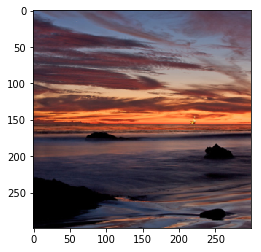

5.645161318592727 5.4027056731283665


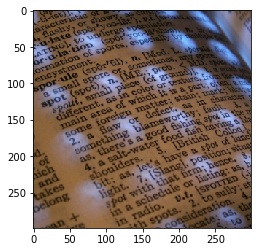

5.645669402554631 5.4025845024734735


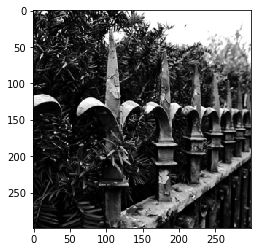

5.478599071037024 5.402616618201137


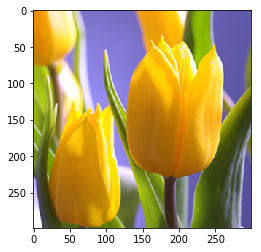

5.9357143342494965 5.4020141288638115


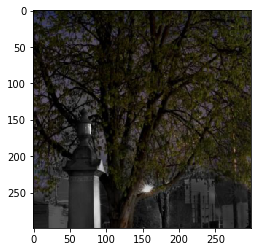

5.0696517592296 5.4028661493211985


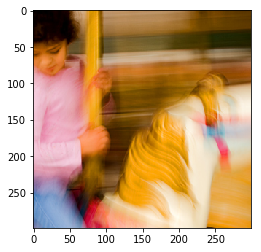

4.826865760143846 5.406907770782709


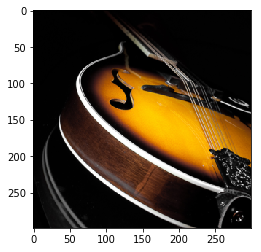

6.072463633492589 5.4019684456288815


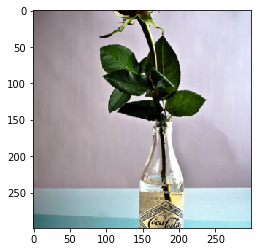

5.194244466722012 5.412184696644545


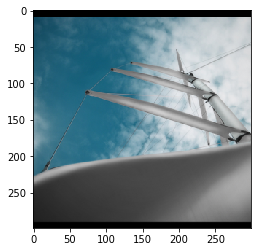

6.48192760720849 5.401048859581351


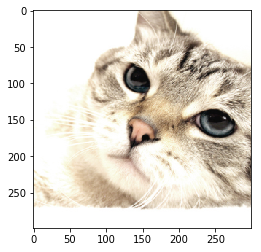

4.938356077298522 5.4295872785151005


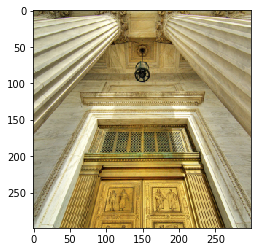

6.914438551291823 5.397528504952788


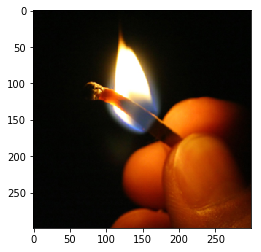

5.44871802860871 5.402151944115758


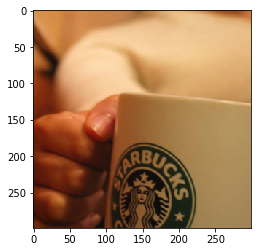

4.06217609718442 5.399256514385343


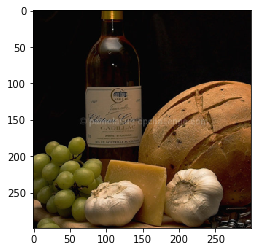

6.707602337002754 5.402679616585374


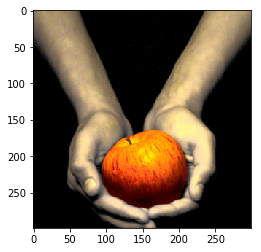

4.606334972195327 5.401323424652219


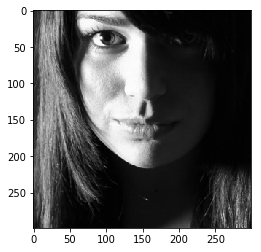

5.519148979336023 5.402801588177681


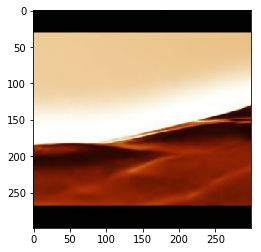

5.458646601065993 5.401924058794975


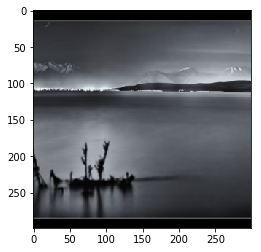

6.09589035063982 5.402976408600807


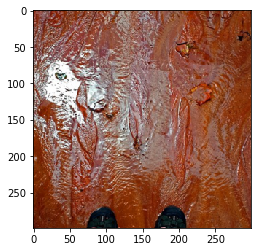

4.667883258312941 5.4022403582930565


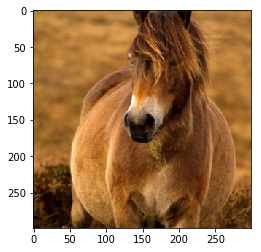

5.999999970197678 5.4025515373796225


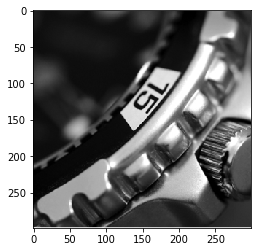

5.600000043399632 5.402837824076414


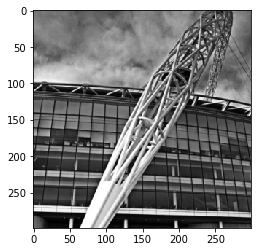

5.735294188372791 5.402175521478057


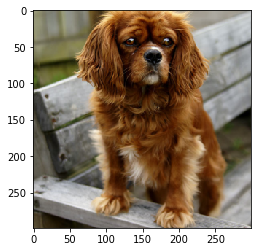

5.750000007450581 5.399240043014288


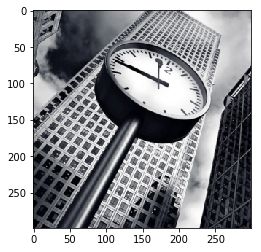

6.920000025071204 5.40778798982501


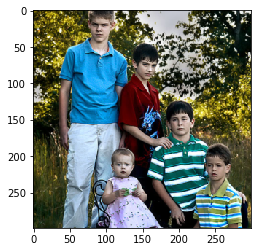

5.872964130714536 5.402369685471058


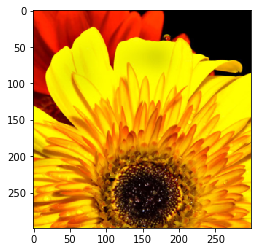

4.703703586943448 5.396636946126819


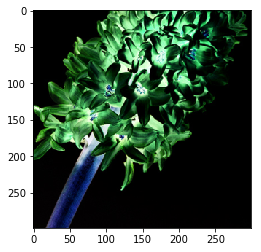

5.7861636290326715 5.401440910995007


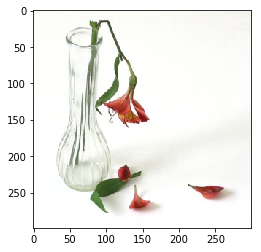

5.748837243765593 5.429839035496116


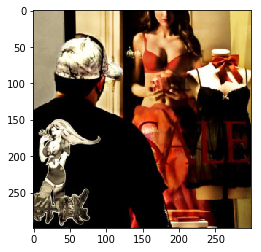

5.562264144420624 5.4019556902348995


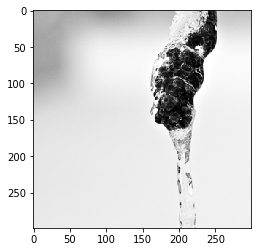

4.95187175553292 5.429520847275853


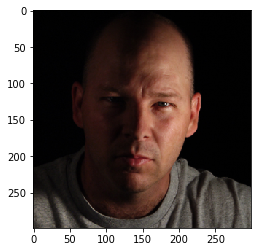

5.508960488252342 5.402679210528731


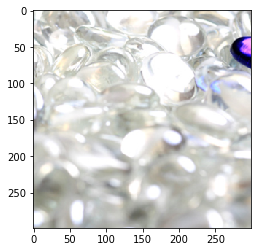

5.083798942621797 5.408433988690376


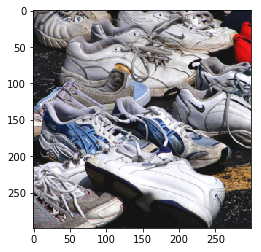

4.644444443285465 5.4131446816027164


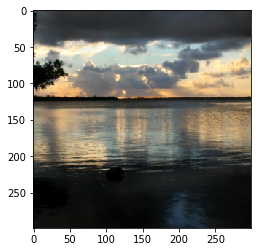

5.394594565033913 5.402662184089422


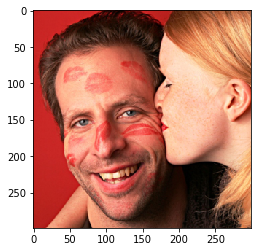

5.490566016174853 5.402740981429815


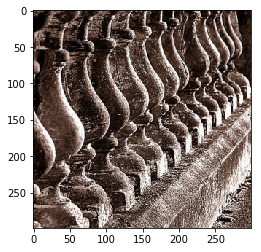

5.585492170415819 5.40061947517097


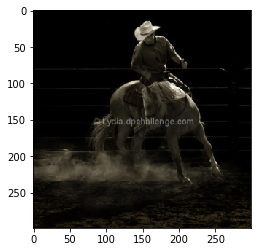

7.137930957600474 5.402690507471561


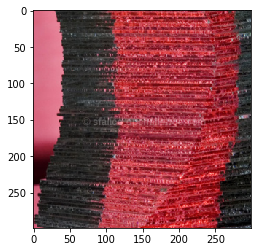

5.659217880107462 5.400560112670064


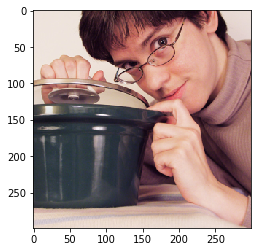

5.000000111293048 5.402725964784622


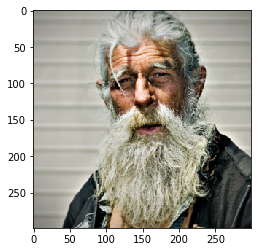

6.271356735378504 5.402375124394894


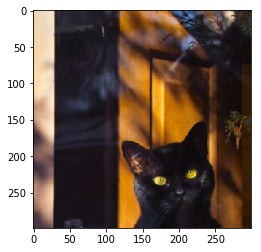

5.42541430098936 5.402667008340359


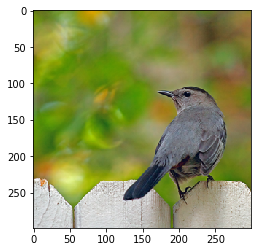

5.91170413303189 5.396190159022808


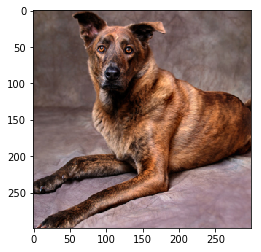

5.625514384359121 5.396042205393314


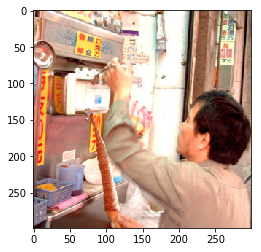

5.246913691982627 5.395584709942341


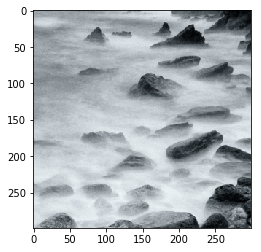

5.98245607316494 5.400900118052959


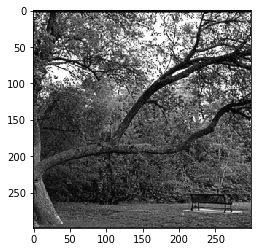

4.66666675824672 5.402608875185251


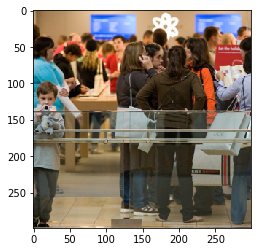

5.948905252851546 5.402467051520944


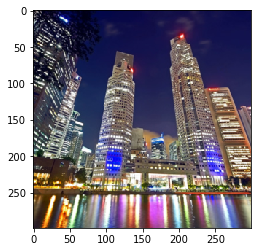

6.627218954265118 5.401079362258315


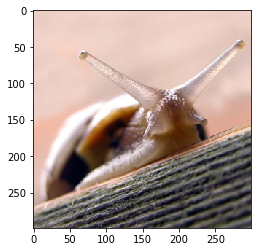

6.56666678795591 5.402784537523985


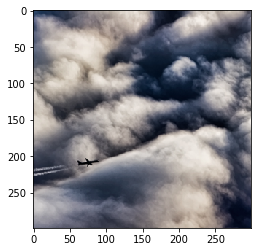

5.568720445036888 5.397592613473535


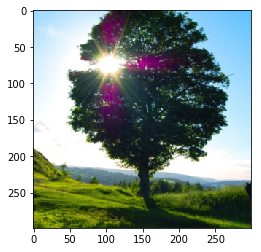

5.291457291692495 5.4049172103405


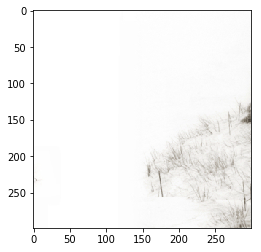

6.54285728931427 5.429765505716205


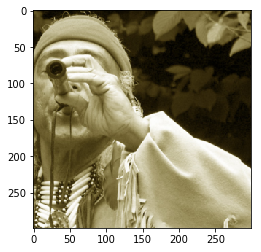

6.055555732920766 5.396840764209628


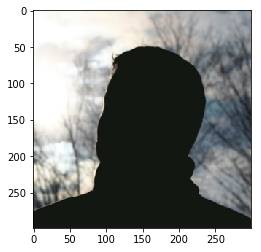

4.33333339728415 5.402615532279015


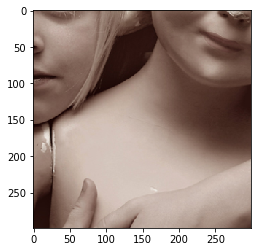

6.546816547401249 5.395168609917164


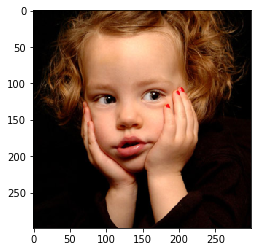

6.206666687503457 5.402152074500918


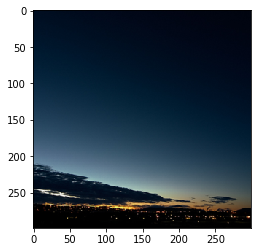

4.8614718690514565 5.402741646394134


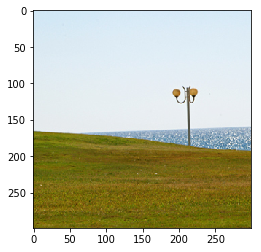

4.896825490519404 5.402482410892844


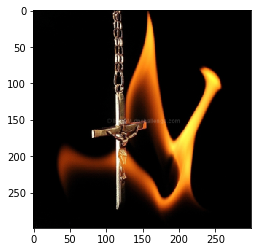

6.266355114988983 5.401656724512577


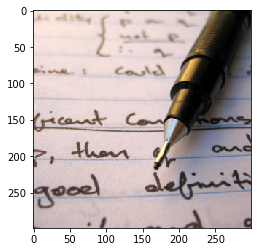

5.031746151857078 5.396337227895856


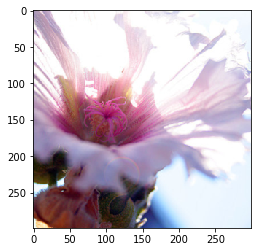

5.225961606949568 5.429705826565623


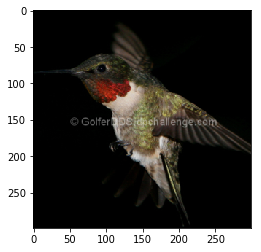

5.985865671187639 5.40151889808476


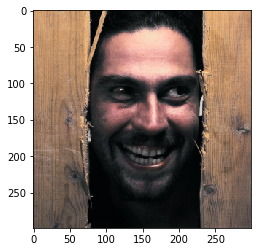

5.932835767045617 5.402253186330199


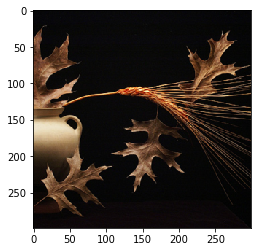

6.583732005208731 5.402333503589034


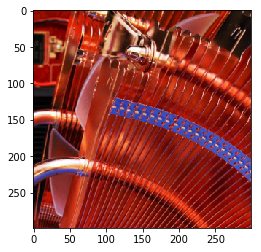

5.532934106886387 5.401731990277767


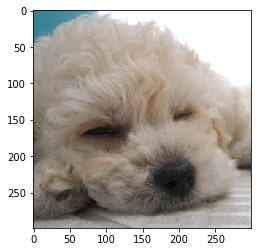

4.964285697322339 5.3976586777716875


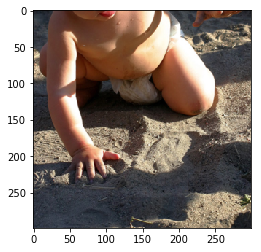

4.563829821534455 5.398431025445461


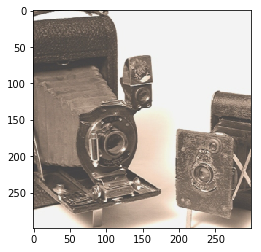

5.360465090721846 5.409024130553007


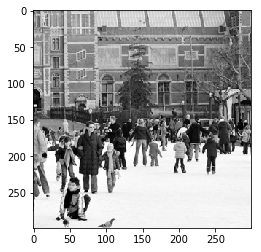

5.970976371318102 5.429450213909149


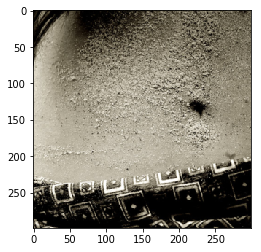

6.530612206086516 5.402223953977227


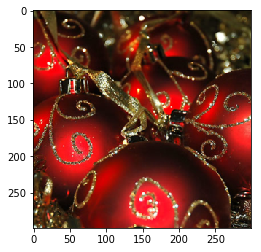

5.563380300067365 5.4011477548629045


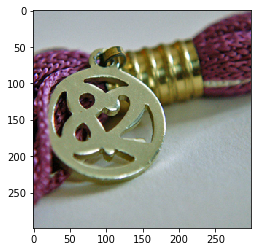

5.061983463354409 5.39508138038218


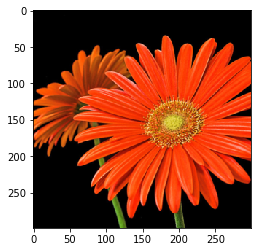

6.183673489838839 5.402037221938372


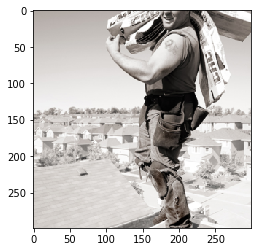

6.266666680108756 5.414940884336829


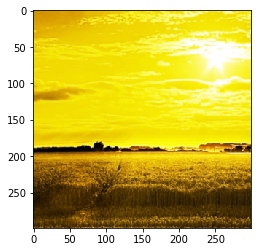

5.379518011584878 5.402658458799124


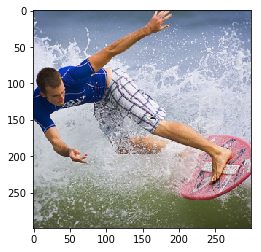

6.2283950522542 5.402495501562953


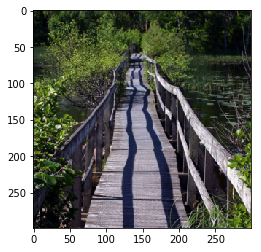

5.592274639755487 5.402388505637646


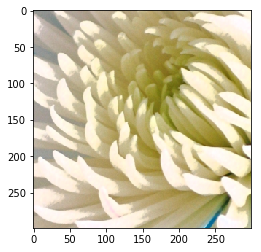

4.413580227643251 5.39902076125145


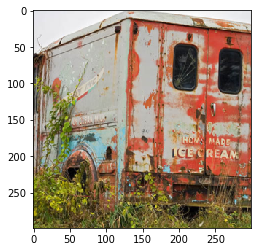

5.8365018386393785 5.40261741168797


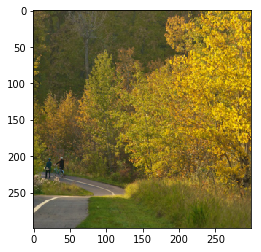

5.209677264094353 5.4026084672659636


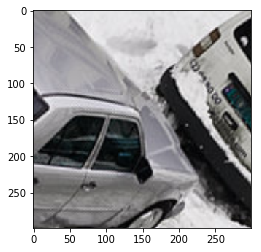

4.66176467994228 5.409931439906359


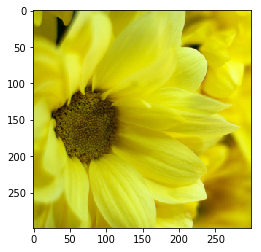

5.319526620209217 5.397764299064875


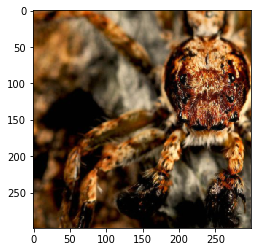

6.263333405833691 5.401992240920663


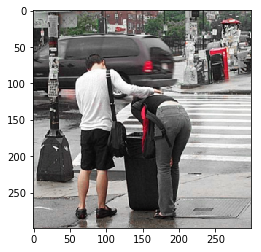

3.772093031555414 5.397297065705061


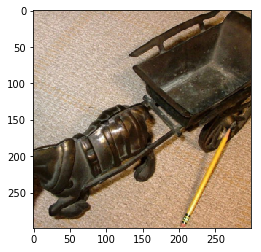

4.186567175667733 5.39461312815547


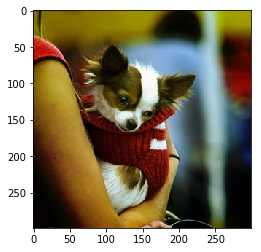

5.845188369974494 5.4022844620049


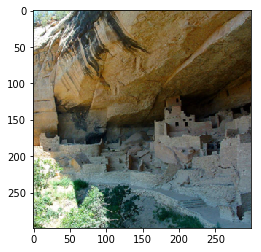

5.763157932087779 5.402609691023827


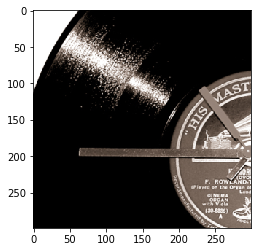

5.047619162593037 5.400505755096674


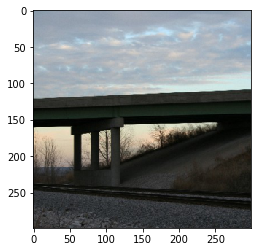

3.9316940295975655 5.402793576940894


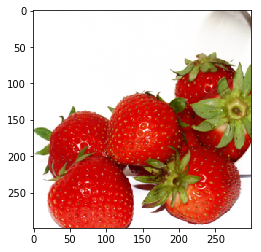

6.718518486246467 5.40833586640656


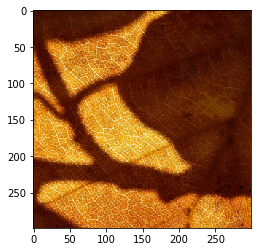

5.285714185796678 5.395489748567343


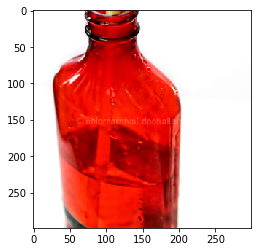

5.27040811534971 5.429559979587793


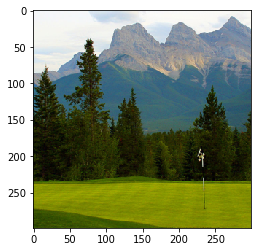

4.198412767611444 5.401433892548084


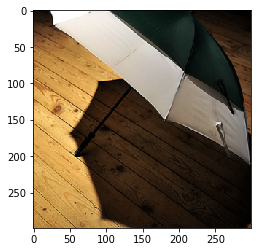

5.1524391286075115 5.402636729180813


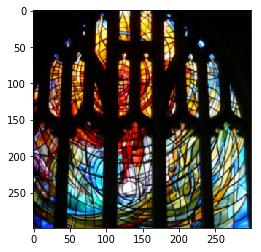

4.409326320514083 5.4026968237012625


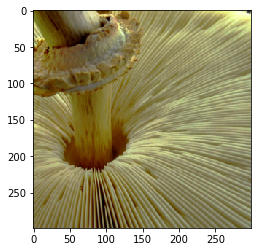

5.732026361860335 5.401046236976981


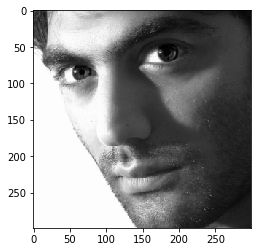

6.299674262292683 5.402628531679511


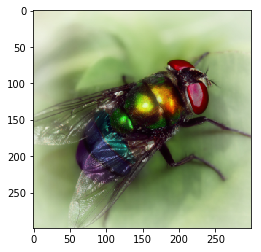

7.3735631592571735 5.395178608596325


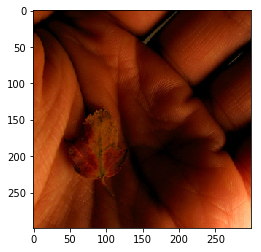

5.256410416215658 5.398771125823259


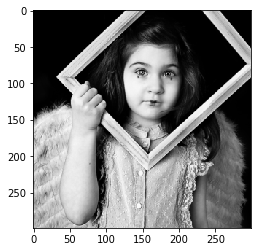

6.652173980837688 5.400905406102538


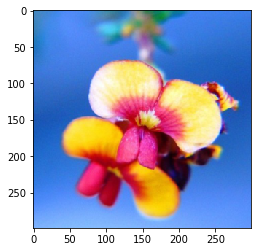

4.686170107219368 5.3995531387627125


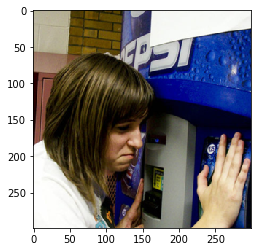

4.6078431606292725 5.400658937171102


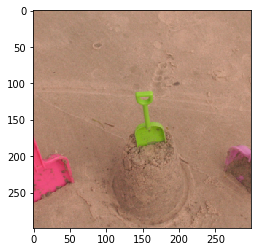

4.606666764244437 5.3960977550596


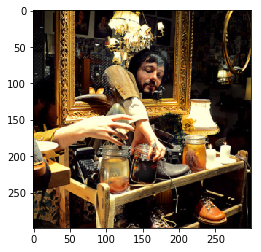

6.477778002154082 5.401636993512511


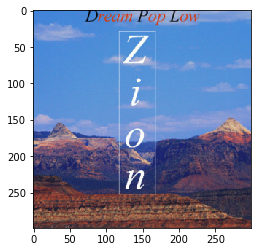

4.842105311807245 5.402379956096411


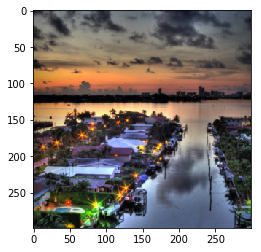

5.875817101914436 5.402399996295571


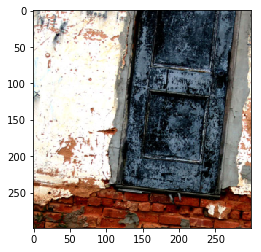

5.604762132279575 5.40256162174046


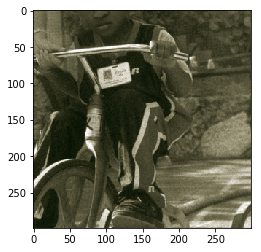

5.1098901983350515 5.4020458199083805


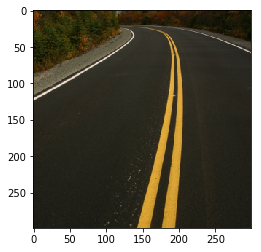

5.418848268687725 5.402534319087863


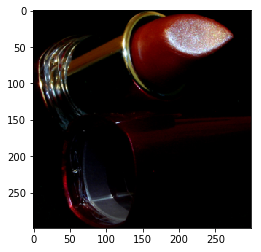

5.485436893068254 5.4014061987400055


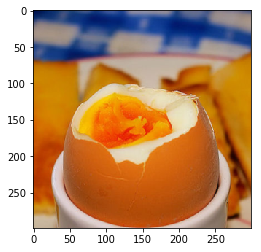

5.424778733402491 5.400113366544247


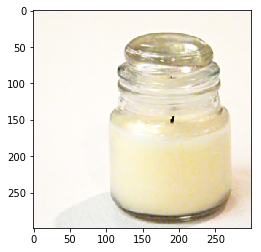

4.40740742534399 5.403699818998575


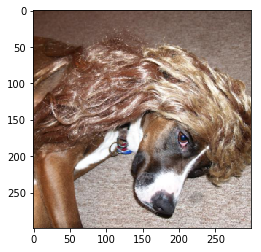

4.485185211524367 5.3974994365125895


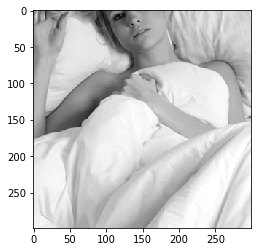

6.485342091182247 5.429241226986051


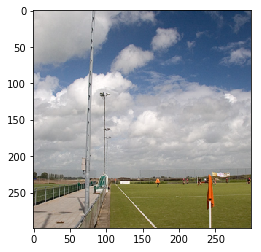

4.907407442107797 5.402246084064245


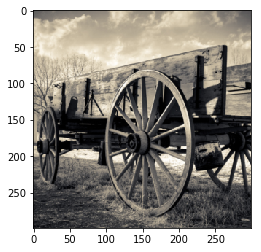

6.088235380128026 5.402751041576266


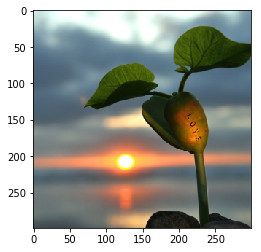

5.748387133702636 5.402774143964052


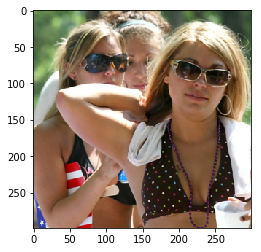

5.248275842517614 5.40363241173327


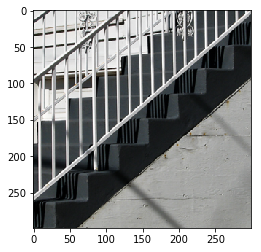

4.928571484982967 5.396145444363356


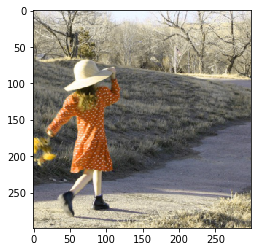

6.441281022736803 5.398243676871061


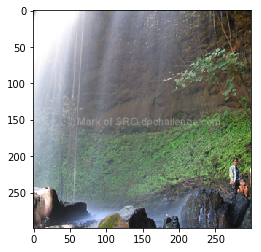

5.672853815369308 5.4025556817650795


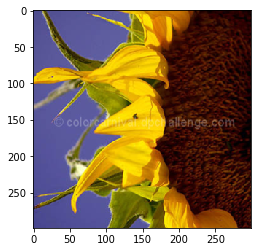

5.631579026579857 5.400585729628801


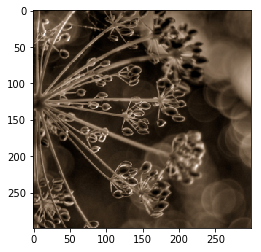

6.319727886468172 5.4026371743530035


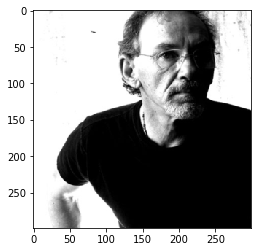

5.547368541359901 5.401621229946613


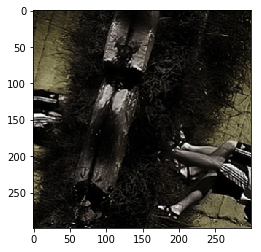

6.079310417175293 5.402751058340073


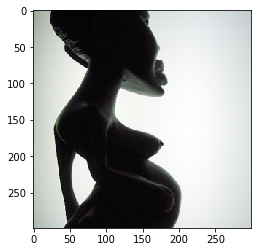

5.329710160382092 5.429562445729971


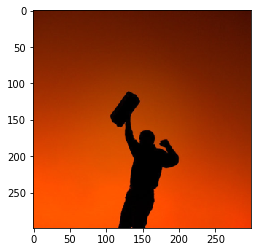

6.745454591698945 5.394630163908005


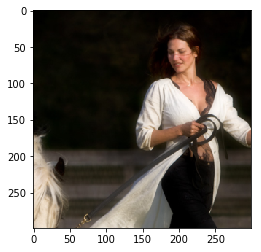

5.576065033907071 5.402266779914498


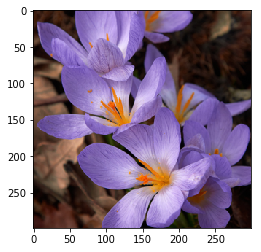

5.886666712351143 5.401827519759536


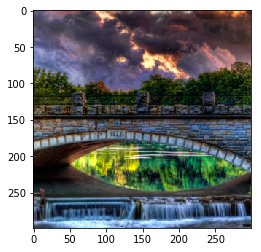

6.015384811442345 5.403160147368908


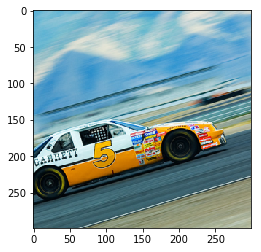

5.944444358814508 5.396713240072131


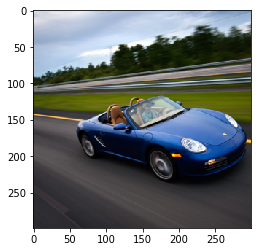

6.938271593302488 5.402627630159259


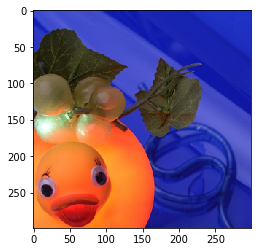

5.410029444843531 5.402503423392773


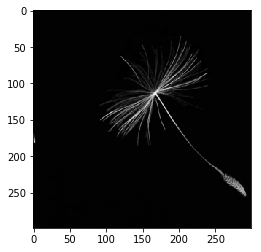

5.625570648815483 5.401592807844281


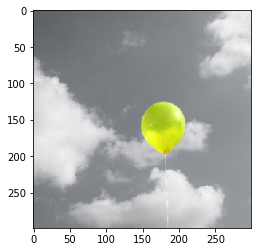

5.801470716483891 5.401155868545175


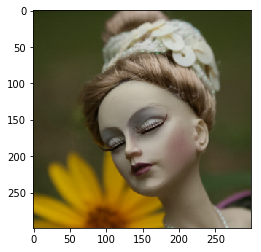

6.408284023404121 5.400043157860637


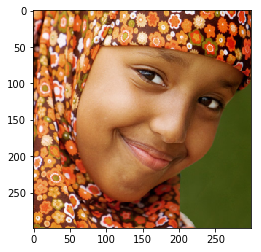

6.177777744829655 5.4022376500070095


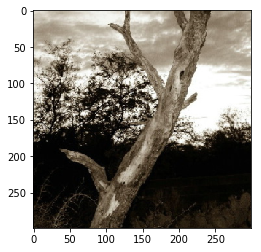

5.061320770531893 5.402840407565236


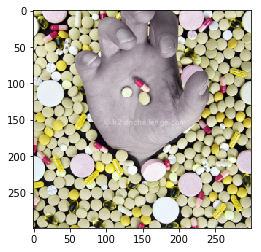

6.097938000690192 5.402750192210078


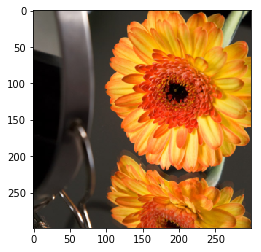

5.5767196151427925 5.397048672661185


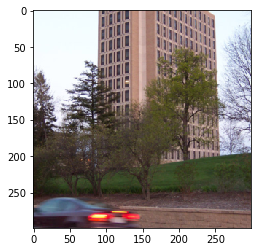

3.916349778883159 5.40100958570838


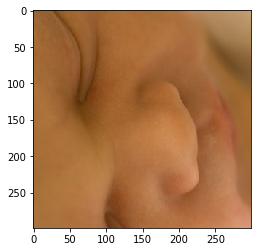

5.249999972060323 5.395933732390404


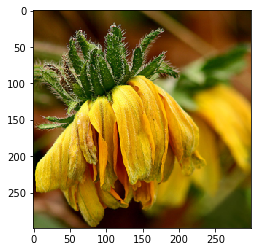

5.9027779549360275 5.402770673856139


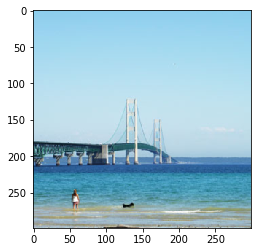

4.869415760040283 5.397173151373863


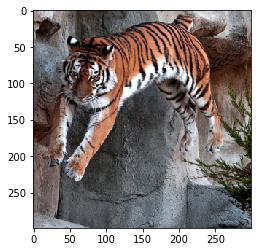

6.390243912115693 5.401882667094469


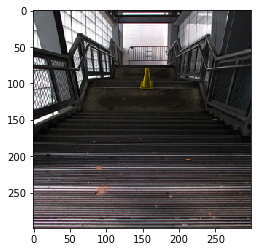

4.883977888152003 5.402670178562403


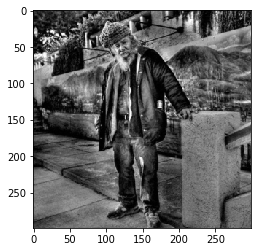

5.684210442006588 5.4021653942763805


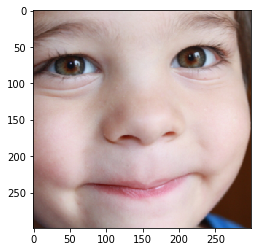

4.467661697417498 5.40441944077611


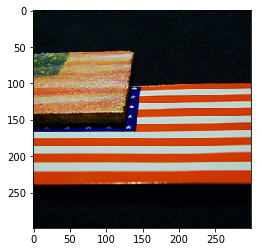

4.158088250551373 5.401786660775542


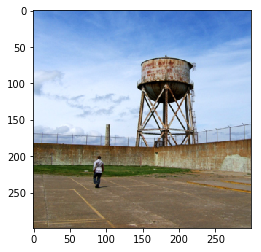

5.2543102921918035 5.401532674208283


In [24]:
dataiter = iter(testLoader)

for i in range(300):
    x, y, image = next(dataiter)
    if i%2 ==0:
        continue
    plt.imshow(image[0], interpolation='nearest')
    plt.show()
    out = model(x.to(device)).cpu().detach().numpy()
    out = calculateMean(out)
    pred = calculateMean(y)
    print(pred, out)

In [0]:
# transformImage = transforms.Compose([transforms.Resize(256),transforms.CenterCrop(224)])
# for i in ['/01.jpeg', '/02.jpg','/03.jpeg']:
#     image = Image.open(open(myFacesDataPath+i, 'rb'))
#     x1 = data_transforms["TRAIN"](image)
#     x1 = x1.unsqueeze(0)
#     x2 = transformImage(image)
#     plt.imshow(x2, interpolation='nearest')
#     plt.show()
#     out = model(x1.to(device)).cpu().detach().numpy()
#     out = calculateMean(out)
#     print(out)